In [0]:
from pyspark.sql import SparkSession
import pyspark.sql.functions as F
import pyspark.sql.types as T
from pyspark.sql.types import StringType
# librerias python
import pandas as pd
import numpy as np
#librerias internas 
#import datavault as dv
import analytics.general_utils as gen_utils

from sklearn.model_selection import train_test_split
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs
from pyspark.sql import SparkSession
from scipy.spatial import distance

from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

import matplotlib.pyplot as plt

In [0]:
cp = gen_utils.read_dlake_table(table_path = 'BBDD_m2/BBDD_CP_0.6',
                         container = 'analytics',
                         environment = 'dev',
                         table_format = 'parquet')

In [0]:
cp.display()

PROV,cp,R_med_unidad_consumo,pob,M_tamano_hogar,FI_pensiones,FI_desempleo,FI_otras_prestaciones,FI_otros_ingresos,PRECIO_m2_FINAL
06,06715,11550.0,606.0,2.2,2099.0,903.0,410.0,1479.0,718.0
33,33783,14350.0,1259.0,2.35,4916.0,235.0,994.0,1768.0,1343.0
13,13610,14080.501072632545,13052.0,2.663352742874655,2372.9859025436713,336.15001532332207,556.9642966595158,1128.925988354275,596.0
17,17401,17001.680149346612,6428.0,2.647545115121345,3295.282202862477,736.3410080896081,582.8397635345364,1806.7302426882393,1244.0
18,18314,12250.0,708.0,2.4499999999999997,2763.0,895.0,752.0,1359.0,876.0
32,32558,15230.351681957187,2616.0,2.143188073394495,5099.605886850153,378.3669724770643,725.3012232415903,1374.795107033639,674.0
05,05163,15312.105263157899,665.0,2.199308270676691,3615.464661654135,349.4616541353382,596.9022556390976,2504.437593984963,858.5
15,15555,15750.0,1363.0,2.2,5433.0,382.0,615.0,1396.0,1349.0
24,24114,17850.0,1007.0,2.2100000000000004,7641.0,499.0,716.0,718.0,520.0
06,06518,10150.0,2004.0,2.13,3353.0,685.0,623.0,950.0,726.0


In [0]:
cp = cp.drop('PROV')

In [0]:
#NORMALIZAR VARIABLES 
from pyspark.sql import SparkSession
from pyspark.sql.functions import mean, stddev, col

# Calcular la media y la desviación estándar de cada columna
summary = cp.select(*(mean(col(c)).alias(c) for c in cp.columns[1:])).collect()[0]
means = [summary[c] for c in cp.columns[1:]]
summary = cp.select(*(stddev(col(c)).alias(c) for c in cp.columns[1:])).collect()[0]
stddevs = [summary[c] for c in cp.columns[1:]]

columnas = cp.columns
columnas.remove('cp')

cp_N = cp

for columna in columnas:
    mean_value = cp.select(mean(col(columna))).first()[0]
    stddev_value = cp.select(stddev(col(columna))).first()[0]
    
    cp_N = cp_N.withColumn(columna, (col(columna) - mean_value) / stddev_value)


In [0]:
cp_N.display()

cp,R_med_unidad_consumo,pob,M_tamano_hogar,FI_pensiones,FI_desempleo,FI_otras_prestaciones,FI_otros_ingresos,PRECIO_m2_FINAL
06715,-1.3904328006447577,-0.4318716723009967,-0.4651971397539415,-1.306501158829825,2.305779881101268,-1.308761925007337,-0.4068836259892124,-0.5717042072457958
33783,-0.5683912484713752,-0.3732715411358139,0.02274222013844762,0.9324702107241871,-1.2047387394593865,1.7659562344412052,-0.173289383631692,0.21022738234754648
13610,-0.6475124329578767,0.6850306745318748,1.0420564653303377,-1.0887352406698336,-0.673168361820887,-0.5350054323196729,-0.6898430499319146,-0.7243372535344162
17401,0.21010563218442307,0.0905938156679072,0.9906353735478897,-0.35568766855077266,1.4299423146562107,-0.3987729530648183,-0.14198432585632123,0.08636941855596104
18314,-1.1849224126014122,-0.4227182061771856,0.3480351267333727,-0.7787492989136503,2.2637377419328772,0.4918435724779395,-0.5038777750649994,-0.3740319013965989
32558,-0.3099320830804703,-0.25149454574354274,-0.6500023071015661,1.0784014581288965,-0.4513069633304329,0.35127642567289646,-0.49111083367925956,-0.6267521911531672
05163,-0.28593035422833973,-0.4265770203274197,-0.46744728617550296,-0.10120440327994212,-0.6032121403841196,-0.3247349396384551,0.42196176450156975,-0.3959259859052125
15555,-0.15737047238468405,-0.36393859528408495,-0.4651971397539415,1.343385439002293,-0.43221443224020056,-0.22945161218721513,-0.47397124576663174,0.21773392560764257
24114,0.4591606917453528,-0.3958859868534648,-0.4326678490944481,3.098319334627163,0.18265185309751894,0.3023061516900156,-1.0219881880448285,-0.8194201348289667
06518,-1.801453576731449,-0.30641534248640934,-0.6929021743703908,-0.30981315832548306,1.1601315887626114,-0.1873321853454543,-0.8344661664983068,-0.5616954828990011


In [0]:
cp_pd = cp_N.toPandas()
#cp_pd = cp.toPandas()

In [0]:
import pandas as pd
pd.DataFrame.iteritems = pd.DataFrame.items

Out[10]: [<matplotlib.lines.Line2D at 0x7f52b954ffa0>]

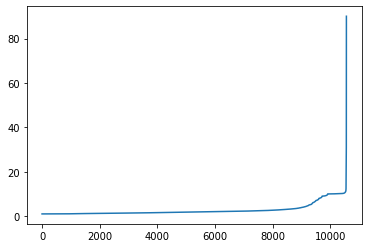

In [0]:
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=len(cp_pd.columns), n_jobs=5)
neighbors_fit = neighbors.fit(cp_pd)
distances, indices = neighbors_fit.kneighbors(cp_pd)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)


In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import StandardScaler
from pyspark.ml.feature import PCA


# Seleccionar las columnas relevantes para PCA (excluir "cp")
feature_cols = ["R_med_unidad_consumo", "pob", "M_tamano_hogar", "FI_pensiones",
                "FI_desempleo", "FI_otras_prestaciones", "FI_otros_ingresos", "PRECIO_m2_FINAL"]

# Crear el VectorAssembler
assembler = VectorAssembler(inputCols=feature_cols, outputCol="features")

# Aplicar el VectorAssembler al DataFrame
ensam = assembler.transform(cp)

# Inicializar el StandardScaler
scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withMean=True, withStd=True)

# Ajustar el scaler al DataFrame y transformar los datos
scaler_model = scaler.fit(ensam)
scaled_data = scaler_model.transform(ensam)

# Aplicar PCA
num_components = 3  # Número de componentes principales a mantener
pca = PCA(k=num_components, inputCol="scaled_features", outputCol="pca_features")
pca_model = pca.fit(scaled_data)
pca_result = pca_model.transform(scaled_data)

# Mostrar los resultados
pca_result.select("cp", "pca_features").show(truncate=False)


+-----+--------------------------------------------------------------+
|cp   |pca_features                                                  |
+-----+--------------------------------------------------------------+
|06715|[0.5507056448551482,-2.6586057287727756,0.8486376082827598]   |
|33783|[0.9418761438272745,1.06564961778893,-1.1404779340573614]     |
|13610|[-0.05012009862256728,-1.3889061282584068,0.3292264241110189] |
|17401|[-0.895452684208488,-1.0857399115432098,-0.09006719413647304] |
|18314|[0.405931144422424,-2.1403930173987518,-0.6944332253077937]   |
|32558|[1.3794468420156745,0.6712483343396501,-0.3739114656035686]   |
|05163|[0.5770393072908028,0.2995603847212054,0.7958170763042377]    |
|15555|[0.8022106488012548,0.8003308163586396,-0.012895083612894227] |
|24114|[1.6962618006637862,1.6456741776309325,-1.0509566092099196]   |
|06518|[1.4634346686081678,-1.7188757896815854,-0.11937711931561817] |
|35004|[-3.0182245524645013,1.9711227903101067,-0.7154608358868286]  |
|47880

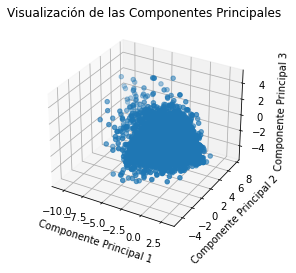

In [0]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Extraer las componentes principales del DataFrame resultante de PCA
pca_features = pca_result.select("pca_features").rdd.map(lambda row: row.pca_features.toArray()).collect()

# Crear figura tridimensional
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Extraer las coordenadas x, y, z de las componentes principales
x = [p[0] for p in pca_features]
y = [p[1] for p in pca_features]
z = [p[2] for p in pca_features]
id = []
# Graficar las componentes principales en 3D
ax.scatter(x, y, z)

# Configuraciones adicionales
ax.set_xlabel('Componente Principal 1')
ax.set_ylabel('Componente Principal 2')
ax.set_zlabel('Componente Principal 3')
ax.set_title('Visualización de las Componentes Principales')

# Mostrar el gráfico
plt.show()


In [0]:
cp_pd_codigos = cp_pd['cp']


X_cp_pd = cp_pd.drop(['cp'],axis=1)

In [0]:
eps_grid = list(range(1,50,1))
eps_grid = [i/10 for i in eps_grid]
min_pts = list(range(6,15))
hpar = list()
for e in eps_grid:
  for pts in min_pts:
      model = DBSCAN(eps= e, min_samples = pts, n_jobs=4).fit(X_cp_pd)
      model.labels_
      labeles = model.labels_
      lista = list(set(labeles))
      X_cp_pd['labels'] = labeles
      X_cp_pd['cp'] = cp_pd_codigos
      if lista != [-1]:
              tamano_clusters = X_cp_pd.groupby('labels')['cp'].count()
              print('epsilon = ', e, 'número mínimo de pts =', pts, tamano_clusters)
              hpar.append((e,pts))


epsilon =  0.1 número mínimo de pts = 6 labels
-1     10443
 0         6
 1         7
 2         7
 3         6
 4         6
 5         6
 6         6
 7         6
 8         6
 9         7
 10        6
 11        6
 12        6
 13        6
 14        6
 15        6
 16        6
 17        6
Name: cp, dtype: int64
epsilon =  3.0 número mínimo de pts = 6 labels
-1     10315
 0         8
 1         8
 2        11
 3         6
 4         8
 5         8
 6         6
 7         6
 8        11
 9         6
 10        6
 11        9
 12        8
 13        6
 14        8
 15        6
 16        8
 17        6
 18        6
 19        6
 20        6
 21        6
 22        6
 23        8
 24        6
 25        7
 26        6
 27        6
 28        8
 29        6
 30        6
 31        8
 32        7
 33        6
Name: cp, dtype: int64
epsilon =  3.0 número mínimo de pts = 7 labels
-1    10533
 0        7
 1        7
 2        7
Name: cp, dtype: int64
epsilon =  3.1 número mínimo de pts = 6 

Silhouette Score: Mide qué tan similares son los objetos en el mismo cluster (cohesión) y qué tan diferentes son los objetos en diferentes clusters (separación).

Davies-Bouldin Index: Mide la media de la razón de la suma de la dispersión dentro del cluster y la distancia entre los centros de los clusters. Un valor más bajo indica clusters más compactos y separados.

Calinski-Harabasz Index: También conocido como el ratio de varianza entre clusters a varianza dentro del cluster. Un valor más alto indica clusters más densos y bien separados.

Silhouette Score: Calcula el promedio del índice de silueta de todos los puntos. Un valor cercano a 1 indica clusters bien definidos.

Davies-Bouldin Index: Calcula la media del ratio de la suma de la dispersión dentro del cluster y la distancia entre los centros de los clusters. Un valor más bajo es mejor.

Calinski-Harabasz Index: Ratio de varianza entre clusters a varianza dentro del cluster. Un valor más alto es mejor.

In [0]:
# Crear un DataFrame vacío con las columnas necesarias
scores= pd.DataFrame(columns=['eps', 'min_samples', 'silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'])

# Todos los posibles hiper parms
for e, min_pts in hpar:

    modelF = DBSCAN(eps=e, min_samples=min_pts, n_jobs=7).fit(X_cp_pd)
    labels = modelF.labels_
    
    silhouette_avg = silhouette_score(X_cp_pd, labels)
    davies_bouldin = davies_bouldin_score(X_cp_pd, labels)
    calinski_harabasz = calinski_harabasz_score(X_cp_pd, labels)
    
    resul = pd.DataFrame([{
        'eps': e,
        'min_samples': min_pts,
        'silhouette_score': silhouette_avg,
        'davies_bouldin_score': davies_bouldin,
        'calinski_harabasz_score': calinski_harabasz
    }])
    
    scores = pd.concat([scores, resul], ignore_index=True)

# Mostrar el DataFrame final
print(scores)

<command-3146132581809517>:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  scores = pd.concat([scores, resul], ignore_index=True)
    eps min_samples  silhouette_score  davies_bouldin_score  \
0   3.0           6         -0.838130             13.846087   
1   3.0           7         -0.535310             16.321526   
2   3.1           6         -0.785746              5.097093   
3   3.1           7         -0.798648             11.470431   
4   3.2           6         -0.631053              4.932711   
5   3.2           7         -0.868419              6.553283   
6   3.3           6         -0.513644              7.646283   
7   3.3           7         -0.817291              5.652718   
8   3.4           6         -0.425561             1

In [0]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Crear un DataFrame vacío con las columnas necesarias
scores= pd.DataFrame(columns=['eps', 'min_samples', 'silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'])

# Hiper parámetros que tienen una cantidad de clusters razonable
hpar = [(3.0, 6), (3.1, 7), (3.2, 7), (4.0, 8), (4.1, 9), (4.2, 9), (4.3, 9)]

for e, min_pts in hpar:
    modelF = DBSCAN(eps=e, min_samples=min_pts, n_jobs=7).fit(X_cp_pd)
    labels = modelF.labels_
    
    silhouette_avg = silhouette_score(X_cp_pd, labels)
    davies_bouldin = davies_bouldin_score(X_cp_pd, labels)
    calinski_harabasz = calinski_harabasz_score(X_cp_pd, labels)
    
    resul = pd.DataFrame([{
        'eps': e,
        'min_samples': min_pts,
        'silhouette_score': silhouette_avg,
        'davies_bouldin_score': davies_bouldin,
        'calinski_harabasz_score': calinski_harabasz
    }])
    
    scores = pd.concat([scores, resul], ignore_index=True)

# Mostrar el DataFrame final
print(scores)



<command-3146132581809508>:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  scores = pd.concat([scores, resul], ignore_index=True)
   eps min_samples  silhouette_score  davies_bouldin_score  \
0  3.0           6         -0.838130             13.846087   
1  3.1           7         -0.798648             11.470431   
2  3.2           7         -0.868419              6.553283   
3  4.0           8         -0.698849             16.536707   
4  4.1           9         -0.668734             12.749032   
5  4.2           9         -0.858557              5.137747   
6  4.3           9         -0.824932              5.564517   

   calinski_harabasz_score  
0                 1.760157  
1                 2.154113  
2                 4.837964  
3    

In [0]:
# Crear un DataFrame vacío con las columnas necesarias
scores= pd.DataFrame(columns=['eps', 'min_samples', 'silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'])

# Hiper parámetros con número de clusters masivo (no tienen sentido)
hpar = [(4.5, 6), (4.5, 7), (4.2, 7), (3.6, 7)]

for e, min_pts in hpar:
    modelF = DBSCAN(eps=e, min_samples=min_pts, n_jobs=7).fit(X_cp_pd)
    labels = modelF.labels_
    
    silhouette_avg = silhouette_score(X_cp_pd, labels)
    davies_bouldin = davies_bouldin_score(X_cp_pd, labels)
    calinski_harabasz = calinski_harabasz_score(X_cp_pd, labels)
    
    resul = pd.DataFrame([{
        'eps': e,
        'min_samples': min_pts,
        'silhouette_score': silhouette_avg,
        'davies_bouldin_score': davies_bouldin,
        'calinski_harabasz_score': calinski_harabasz
    }])
    
    scores = pd.concat([scores, resul], ignore_index=True)

# Mostrar el DataFrame final
print(scores)

<command-3146132581809511>:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  scores = pd.concat([scores, resul], ignore_index=True)
   eps min_samples  silhouette_score  davies_bouldin_score  \
0  4.5           6         -0.058452              5.791526   
1  4.5           7         -0.241084              7.194103   
2  4.2           7         -0.362562              8.758366   
3  3.6           7         -0.646040              4.546805   

   calinski_harabasz_score  
0                17.840081  
1                15.118858  
2                12.172556  
3                 8.980304  


In [0]:
# Crear un DataFrame vacío con las columnas necesarias
scores= pd.DataFrame(columns=['eps', 'min_samples', 'silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'])

# Hiper parámetros con número de clusters masivo (no tienen sentido)
hpar = [(4.4,9),(4.5,9)]

for e, min_pts in hpar:
    modelF = DBSCAN(eps=e, min_samples=min_pts, n_jobs=7).fit(X_cp_pd)
    labels = modelF.labels_
    
    silhouette_avg = silhouette_score(X_cp_pd, labels)
    davies_bouldin = davies_bouldin_score(X_cp_pd, labels)
    calinski_harabasz = calinski_harabasz_score(X_cp_pd, labels)
    
    resul = pd.DataFrame([{
        'eps': e,
        'min_samples': min_pts,
        'silhouette_score': silhouette_avg,
        'davies_bouldin_score': davies_bouldin,
        'calinski_harabasz_score': calinski_harabasz
    }])
    
    scores = pd.concat([scores, resul], ignore_index=True)

# Mostrar el DataFrame final
print(scores)

<command-3146132581809516>:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  scores = pd.concat([scores, resul], ignore_index=True)
   eps min_samples  silhouette_score  davies_bouldin_score  \
0  4.4           9         -0.800188              8.233915   
1  4.5           9         -0.760729              7.370339   

   calinski_harabasz_score  
0                 9.030514  
1                10.196295  


/databricks/python/lib/python3.9/site-packages/matplotlib/collections.py:1120: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


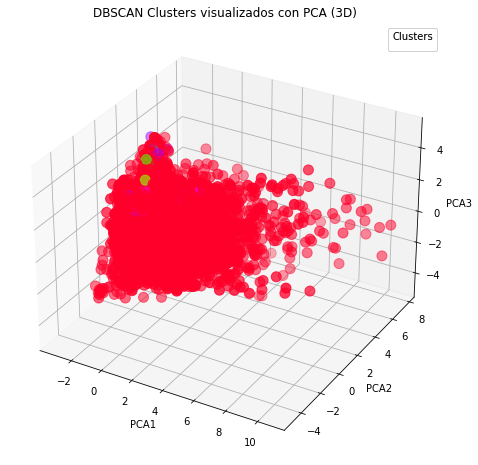

In [0]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns


# Realizar DBSCAN
modelF = DBSCAN(eps=4.3, min_samples=9, n_jobs=7).fit(X_cp_pd)
labels = modelF.labels_
X_cp_pd['labels'] = labels
X_cp_pd['cp'] = cp_pd_codigos
lista = list(set(labels))
tamano_clusters = X_cp_pd.groupby('labels')['cp'].count()
#print('epsilon = ', 4, 'número mínimo de pts =', 8, tamano_clusters)

# Separar las características de las etiquetas
X = X_cp_pd.drop(columns=['labels', 'cp'])  # Ajusta 'cp' si es necesario

# Realizar PCA para reducir a 3 dimensiones
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)

# Convertir el resultado del PCA a un DataFrame
pca_df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2', 'PCA3'])
pca_df['labels'] = X_cp_pd['labels']

# Graficar los resultados en 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Colores para los diferentes clusters
palette = sns.color_palette("hsv", len(pca_df['labels'].unique()))
colors = [palette[label] for label in pca_df['labels']]

scatter = ax.scatter(pca_df['PCA1'], pca_df['PCA2'], pca_df['PCA3'], c=colors, s=100)
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

ax.set_title('DBSCAN Clusters visualizados con PCA (3D)')
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('PCA3')

plt.show()


/databricks/python/lib/python3.9/site-packages/matplotlib/collections.py:1120: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


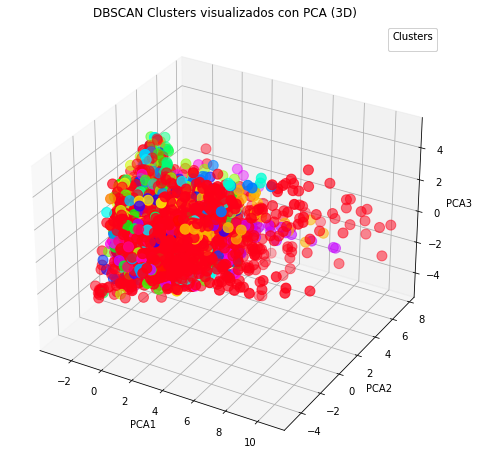

In [0]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns



# Realizar DBSCAN
modelF = DBSCAN(eps=4.1, min_samples=6, n_jobs=7).fit(X_cp_pd)
labels = modelF.labels_
X_cp_pd['labels'] = labels
X_cp_pd['cp'] = cp_pd_codigos
lista = list(set(labels))
tamano_clusters = X_cp_pd.groupby('labels')['cp'].count()
#print('epsilon = ', 4, 'número mínimo de pts =', 8, tamano_clusters)

# Separar las características de las etiquetas
X = X_cp_pd.drop(columns=['labels', 'cp'])  # Ajusta 'cp' si es necesario

# Realizar PCA para reducir a 3 dimensiones
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)

# Convertir el resultado del PCA a un DataFrame
pca_df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2', 'PCA3'])
pca_df['labels'] = X_cp_pd['labels']

# Graficar los resultados en 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Colores para los diferentes clusters
palette = sns.color_palette("hsv", len(pca_df['labels'].unique()))
colors = [palette[label] for label in pca_df['labels']]

scatter = ax.scatter(pca_df['PCA1'], pca_df['PCA2'], pca_df['PCA3'], c=colors, s=100)
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

ax.set_title('DBSCAN Clusters visualizados con PCA (3D)')
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('PCA3')

plt.show()

/databricks/python/lib/python3.9/site-packages/matplotlib/collections.py:1120: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


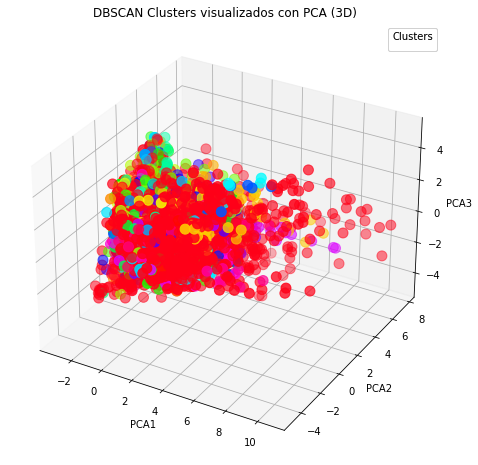

In [0]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns



# Realizar DBSCAN
modelF = DBSCAN(eps=4.2, min_samples=6, n_jobs=7).fit(X_cp_pd)
labels = modelF.labels_
X_cp_pd['labels'] = labels
X_cp_pd['cp'] = cp_pd_codigos
lista = list(set(labels))
tamano_clusters = X_cp_pd.groupby('labels')['cp'].count()
#print('epsilon = ', 4, 'número mínimo de pts =', 8, tamano_clusters)

# Separar las características de las etiquetas
X = X_cp_pd.drop(columns=['labels', 'cp'])  # Ajusta 'cp' si es necesario

# Realizar PCA para reducir a 3 dimensiones
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)

# Convertir el resultado del PCA a un DataFrame
pca_df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2', 'PCA3'])
pca_df['labels'] = X_cp_pd['labels']

# Graficar los resultados en 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Colores para los diferentes clusters
palette = sns.color_palette("hsv", len(pca_df['labels'].unique()))
colors = [palette[label] for label in pca_df['labels']]

scatter = ax.scatter(pca_df['PCA1'], pca_df['PCA2'], pca_df['PCA3'], c=colors, s=100)
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

ax.set_title('DBSCAN Clusters visualizados con PCA (3D)')
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('PCA3')

plt.show()

In [0]:
# Todas las opciones con los mejores scores proponen eliminar un gran porcentaje de los datos y no detectan esas observaciones más dispersas. Las opciones que eliminan menos obs tampoco detectan ese trozo de nube que parece outlier.

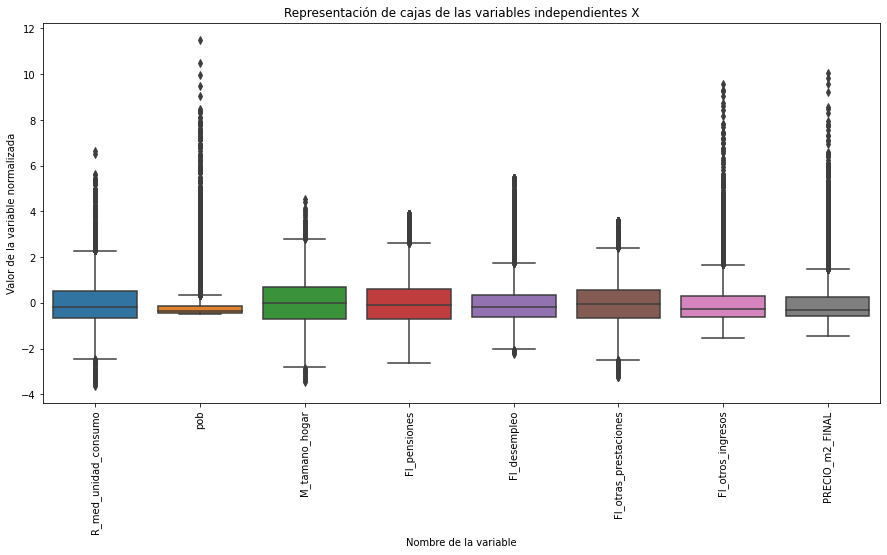

In [0]:
import seaborn as sns
plt.figure(figsize=(15,7))
ax = sns.boxplot(data=cp_pd)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title(u'Representación de cajas de las variables independientes X')
plt.ylabel('Valor de la variable normalizada')
_ = plt.xlabel('Nombre de la variable')

In [0]:
# QUITAR OUTLIERS A PARTIR DE ZSCORES

mask = (cp_pd.drop(columns = ['cp']) > -3) & (cp_pd.drop(columns = ['cp']) < 3)
cp_final = cp_pd[mask.all(axis =1)]

In [0]:
cp_final.describe()

,R_med_unidad_consumo,pob,M_tamano_hogar,FI_pensiones,FI_desempleo,FI_otras_prestaciones,FI_otros_ingresos,PRECIO_m2_FINAL
count,9602.000000,9602.000000,9602.000000,9602.000000,9602.000000,9602.000000,9602.000000,9602.000000
mean,-0.079293,-0.133883,-0.032832,-0.012940,-0.074649,-0.031707,-0.094958,-0.143448
std,0.874619,0.597421,0.967322,0.930184,0.833543,0.927376,0.734961,0.666828
min,-2.959121,-0.485985,-2.969953,-2.617050,-2.130485,-2.957694,-1.544140,-1.459978
25%,-0.703108,-0.429808,-0.725431,-0.701653,-0.626652,-0.650366,-0.612142,-0.592973
50%,-0.157370,-0.360708,-0.044858,-0.091241,-0.211493,-0.087299,-0.271347,-0.332120
75%,0.459161,-0.172995,0.650862,0.600949,0.288018,0.540885,0.247019,0.135162
max,2.974327,2.998704,2.982908,2.975124,2.987315,2.994183,2.999111,2.985146


In [0]:
cp_final_spark = spark.createDataFrame(cp_final)

In [0]:
environment='desarrollo'
container='analytics'

gen_utils.write_dlake_table(df=cp_final_spark, 
                         table_path= 'BBDD_m2/cp_final',
                         container='analytics', 
                         mode="overwrite",
                         environment='dev',
                         table_format="PARQUET")

In [0]:
centroides, etiquetas = modelo_kmeans.cluster_centers_, modelo_kmeans.labels_
cp_80['k_means'] = modelo_kmeans.predict(X_train)
cp_80.groupby('k_means').size()/cp_80.shape[0]

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
<command-4215279509581838> in <cell line: 1>()
----> 1 centroides, etiquetas = modelo_kmeans.cluster_centers_, modelo_kmeans.labels_
      2 cp_80['k_means'] = modelo_kmeans.predict(X_train)
      3 cp_80.groupby('k_means').size()/cp_80.shape[0]

NameError: name 'modelo_kmeans' is not defined